In [1]:
%load_ext autoreload
%autoreload 2

import os
from pathlib import Path
import numpy as np

from IPython.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))


# Override/set credentials in env var
os.environ['CWD'] = str(Path(os.getcwd()).parent)

# Base paths
cwd = Path(os.environ['CWD'])
dir_data = cwd / 'data'

import plotly.io as pio
pio.renderers.default='notebook'

In [4]:
!pip install -e ../

Obtaining file:///root/work/toptal/Ivan-Sanchez
  Running setup.py develop for author-classification
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [ ]:
# !pip install wordcloud

In [7]:
!pip install plotly-orca

ERROR: Could not find a version that satisfies the requirement plotly-orca (from versions: none)
ERROR: No matching distribution found for plotly-orca
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [2]:
import author_classification
author_classification.__version__

'0.0.1'

In [48]:
import pandas as pd

df_tr_ev = pd.read_csv(dir_data / 'train.csv')
df_tr_ev['split'] = 'tr'
df_te = pd.read_csv(dir_data / 'test.csv')
df_te['split'] = 'te'

df = pd.concat([df_tr_ev, df_te])

# Exploratory Data Analysis

## What is the shape of the data?

In [4]:
df.shape

(41000, 4)

In [5]:
df.sample(4)

,Unnamed: 0,text,author,split
30716,30716,\nHere's the law a-standing ready to take a ma...,twain,tr
5327,5327,\n\nP. S. Let me have your return per next po...,defoe,tr
29424,29424,”\n\n“Most certainly it does. ” She pulled a l...,doyle,tr
881,881,"Amy, came to see me, so I took her to\n t...",defoe,tr


It looks like the data only consists in an index, the passage text and the author to whom this passage pertains to

## Number of different authors and distribution

How many different authors are there?

In [3]:
df_tr_ev['author'].unique()

array(['defoe', 'dickens', 'doyle', 'twain'], dtype=object)

Is the dataset imbalanced?

In [6]:
import plotly.express as px
px.bar(df_tr_ev['author'].value_counts(), width=600, height=400)

The dataset is perfectly balanced. Let's see some statistics per author.

To get statistics per author (e.g. mean number of tokens, word rates, etc.) we need to preprocess the text

# Text preprocessing

Let's take a look at some samples to decide what pre-processing we'll do

In [9]:
df_samples = df_tr_ev.groupby('author').sample(3, random_state=288)
with pd.option_context('display.max_colwidth', None):
    display(df_samples)

,Unnamed: 0,text,author,split
1956,1956,"_The\nExplanation of the Word_ Keys, 25. _The Pyrates conceal their Booty on\nthem_, ib. _The Plunderers turn Pyrates_, 29. _The_\nSpaniards _make Reprisals_, ib. _The Names of Ships taken by them_, ib",defoe,tr
2152,2152,"Then I called him into the cabin, and told him the story;\nand we called in the men, and they told us the rest of it; but as it took\nup a great deal of time, before we had done a seaman comes to the cabin\ndoor, and called out to us that the captain bade him tell us we were\nchased by five sloops, or boats, full of men",defoe,tr
8934,8934,"The actual\nloss of time and of money incurred by such courses of conduct, is\ngenerally of less consequence than the losses arising from habitual\ndistraction of mind, and the acquisition of an acquaintanceship with a\nset of idle or silly companions",defoe,tr
10674,10674,"But he thought it better not to ask\nthe question; and walked back to the shop: thinking over all he had\nseen and heard. \n\n\n\n\n CHAPTER VI. \nOLIVER, BEING GOADED BY THE TAUNTS OF NOAH, ROUSES INTO ACTION, AND\nRATHER ASTONISHES HIM\n\n\nThe month’s trial over, Oliver was formally apprenticed",dickens,tr
13372,13372,"‘Hold up,\nSir!’\n\nThis last observation of Mr. Weller’s bore reference to a demonstration\nMr. Winkle made at the instant, of a frantic desire to throw his feet in\nthe air, and dash the back of his head on the ice",dickens,tr
15799,15799,"\n\n‘Ah,’ said Mr. John Smauker, ‘you disliked the killibeate taste,\nperhaps?’\n\n‘I don’t know much about that ‘ere,’ said Sam. ‘I thought they’d a wery\nstrong flavour o’ warm flat irons. ’\n\n‘That _is_ the killibeate, Mr",dickens,tr
26411,26411,"\n\n “It was very essential for Stapleton to get some article of Sir\n Henry’s attire so that, in case he was driven to use the dog, he\n might always have the means of setting him upon his track",doyle,tr
27370,27370,"It never recovered from the blow, and much of\n my capital was irretrievably swallowed up. And yet, if it were\n not for the loss of the charming companionship of the boys, I\n could rejoice over my own misfortune, for, with my strong tastes\n for botany and zoology, I find an unlimited field of work here,\n and my sister is as devoted to Nature as I am",doyle,tr
29594,29594,"As we reached it the fog was lifting,\nand a thin, watery sunshine was breaking through. A butler answered our\nring. \n\n“Sir James, sir!” said he with solemn face. ”\n\nWe were ushered into a dim-lit drawing-room, where an instant later we\nwere joined by a very tall, handsome, light-bearded man of fifty, the\nyounger brother of the dead scientist",doyle,tr
30032,30032,"In one was my piece of money, in the other lay four silver\ngroschen. She gazed a little while, perhaps to see if the groschen would\nvanish away; then she said, fervently:\n\n“It's true--it's true--and I'm ashamed and beg forgiveness, O dear\nmaster and benefactor!” And she ran to Satan and kissed his hand, over\nand over again, according to the Austrian custom",twain,tr


It looks like the text has a lot of special punctuation for quotations.

Counting these punctuations in each text might be a good feature because some authors might be more prone of having a specific writting style that uses more punctuations.

Anyway, to analyze the distribution of words per author, we need to preprocess the text and eliminate all the quotes, signs, etc. and leave only the pure tokens.

Also, for the analysis of the distribution of works to be the most precise as possible, we will lemmatize the words before preprocessing them.

Because some authors might be more prone to use certain verb tenses or forms, so we will also keep the non-lemmatized version, so we will end up having two texts:

- Text → Lemmatize → Process
- Text → Process

And when we build a classifier, we will see which one works better for this use case

In [49]:
import re

CHARS_QUOTE = '''«‹»›„“‟”’"❝❞❮❯⹂〝〞〟＂‚‘‛❛❜❟'''
CHARS_PARENTHESIS = '''()[]'''
CHARS_HYPHEN = '-–—−‧'
CHARS_EXCLAM_QUESTI = '?!'
CHARS_PUNCT_STOP = '.'
CHARS_PUNCT_PAUSES = ',;:'
CHARS_UNDERSCORE = '_'

CHARS_ALL = CHARS_QUOTE + CHARS_PARENTHESIS + CHARS_HYPHEN + CHARS_EXCLAM_QUESTI + CHARS_PUNCT_STOP + CHARS_PUNCT_PAUSES + CHARS_UNDERSCORE
REGEX_ALL_CHARS_SUB = '|'.join([re.escape(c) for c in CHARS_ALL])


# Text features
def char_freq(text, list_chars):
    '''
    Returns the number of characters in text that are in the specified `list_chars`
    '''
    return len([c for c in text if c in list_chars])

def char_freq_ratio(text, list_chars):
    '''
    Returns the ratio n_chars/text_length_in_chars of characters in text that are in the specified `list_chars`
    '''
    return char_freq(text, list_chars) / len(text)

In [50]:
import re
def normalize_spaces(txt):
    return re.sub('(\s|\t|\n)+', ' ', txt)

def remove_punct(txt):
    return re.sub(REGEX_ALL_CHARS_SUB, ' ', txt)

def remove_single_quotes(txt):
    '''
    Remove single quote in a not generic way, to avoid removing contractions (e.g. they've)
        https://regex101.com/r/oGSErP/1
    '''
    return re.sub('''(?<!\w)'|'(?!\w)''', '', txt)
    
    
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
nltk.download('punkt', quiet=True)
STOPWORDS_EN = set(stopwords.words('english'))
 
def remove_stopwords(txt):
    return ' '.join([w for w in word_tokenize(txt) if w.lower() not in STOPWORDS_EN])
 

def preprocess_text(txt):
    for fn in [
        remove_punct,
        normalize_spaces,
        remove_single_quotes,
        lambda txt: txt.lower(),
        remove_stopwords
    ]:
        txt = fn(txt)
    return txt

# for text in df_samples['text']:
# #     for charset in [
# #         CHARS_QUOTE,
# #         CHARS_HYPHEN,
# #         CHARS_EXCLAM_QUESTI,
# #         CHARS_PUNCT_STOP,
# #         CHARS_PUNCT_PAUSES,
# #     ]:
# #         print(char_freq(text, charset))
# #         print(char_freq_ratio(text, charset))

#     print(text)
#     print('--------')
#     print(preprocess_text(text))
#     print('#################################')


In [51]:
from tqdm import tqdm 
tqdm.pandas()
df_tr_ev['text_processed'] = df_tr_ev['text'].progress_apply(preprocess_text)

100%|███████████████████████████████████| 40000/40000 [00:09<00:00, 4046.06it/s]


In [52]:
df_samples = df_tr_ev.groupby('author').sample(1, random_state=288)
with pd.option_context('display.max_colwidth', None):
    display(df_samples[['text', 'text_processed']])

,text,text_processed
1956,"_The\nExplanation of the Word_ Keys, 25. _The Pyrates conceal their Booty on\nthem_, ib. _The Plunderers turn Pyrates_, 29. _The_\nSpaniards _make Reprisals_, ib. _The Names of Ships taken by them_, ib",explanation word keys 25 pyrates conceal booty ib plunderers turn pyrates 29 spaniards make reprisals ib names ships taken ib
10674,"But he thought it better not to ask\nthe question; and walked back to the shop: thinking over all he had\nseen and heard. \n\n\n\n\n CHAPTER VI. \nOLIVER, BEING GOADED BY THE TAUNTS OF NOAH, ROUSES INTO ACTION, AND\nRATHER ASTONISHES HIM\n\n\nThe month’s trial over, Oliver was formally apprenticed",thought better ask question walked back shop thinking seen heard chapter vi oliver goaded taunts noah rouses action rather astonishes month trial oliver formally apprenticed
26411,"\n\n “It was very essential for Stapleton to get some article of Sir\n Henry’s attire so that, in case he was driven to use the dog, he\n might always have the means of setting him upon his track",essential stapleton get article sir henry attire case driven use dog might always means setting upon track
30032,"In one was my piece of money, in the other lay four silver\ngroschen. She gazed a little while, perhaps to see if the groschen would\nvanish away; then she said, fervently:\n\n“It's true--it's true--and I'm ashamed and beg forgiveness, O dear\nmaster and benefactor!” And she ran to Satan and kissed his hand, over\nand over again, according to the Austrian custom",one piece money lay four silver groschen gazed little perhaps see groschen would vanish away said fervently 's true 's true 'm ashamed beg forgiveness dear master benefactor ran satan kissed hand according austrian custom


In [13]:
import spacy

2022-04-24 09:51:11.884870: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-04-24 09:51:11.884934: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [47]:
# !python3 -m spacy download en_core_web_sm

In [53]:
nlp = spacy.load("en_core_web_sm", disable=['parser','ner'])
def lemmatize(df, colname_text='text'):
    df[f'{colname_text}_lemmatized'] = df[colname_text].progress_apply(lambda txt: ' '.join([tok.lemma_ for tok in nlp(txt)]))
    return df

In [54]:
df_tr_ev = lemmatize(df_tr_ev)

100%|████████████████████████████████████| 40000/40000 [02:56<00:00, 226.18it/s]


In [56]:
# Also process the lemamatized text
df_tr_ev['text_lemmatized_processed'] = df_tr_ev['text_lemmatized'].progress_apply(preprocess_text)

100%|███████████████████████████████████| 40000/40000 [00:10<00:00, 3651.03it/s]


In [57]:
df_tr_ev

,Unnamed: 0,text,author,split,text_processed,text_lemmatized,text_lemmatized_processed
0,0,"Hardy, Thomas Sutton,\nChristopher Moody_, an...",defoe,tr,hardy thomas sutton christopher moody valen as...,"Hardy , Thomas Sutton , \n Christopher Moody...",hardy thomas sutton christopher moody valen as...
1,1,To the vest was a\ngirdle five or six inches ...,defoe,tr,vest girdle five six inches wide turkish mode ...,to the vest be a \n girdle five or six inch ...,vest girdle five six inch wide turkish mode en...
2,2,"\n\nAmy was concerned at it as well as I, but ...",defoe,tr,amy concerned well could help though gave us g...,"\n\n Amy be concern at it as well as I , but c...",amy concern well could help though give great ...
3,3,"""Well,"" said I, ""thou art very kind, but this...",defoe,tr,well said thou art kind worth thy pains know t...,""" well , "" say I , "" thou art very kind , bu...",well say thou art kind worth thy pain know tis...
4,4,"\n\n“Now, Friday,” says I, laying down the dis...",defoe,tr,friday says laying discharged pieces taking mu...,"\n\n "" now , Friday , "" say I , lay down the d...",friday say lay discharge piece take musket yet...
...,...,...,...,...,...,...,...
39995,39995,The Prince continued\nto struggle for freedo...,twain,tr,prince continued struggle freedom rage treatme...,the Prince continue \n to struggle for free...,prince continue struggle freedom rage treatmen...
39996,39996,“Are you so unobservant as not to have\nfound...,twain,tr,unobservant found sanity happiness impossible ...,""" be you so unobservant as not to have \n fi...",unobservant find sanity happiness impossible c...
39997,39997,Have at thee!”\n\nThey took their lath swords...,twain,tr,thee took lath swords dumped traps ground stru...,"have at thee ! "" \n\n they take their lath s...",thee take lath sword dump trap ground strike f...
39998,39998,"But the vast ruin will still stand for ages,...",twain,tr,vast ruin still stand ages shame puny labors m...,but the vast ruin will still stand for age ...,vast ruin still stand age shame puny labor mod...


# Statistics: global and per author

In [97]:
from collections import Counter

NUM_TOP_WORDS = 50

def most_common_words(txt, n=NUM_TOP_WORDS):
    return Counter(word_tokenize(all_dataset_text)).most_common(n)

def plot_most_common_words_freq(list_tuples):
    fig = px.bar(
        y=[x[0] for x in list_tuples],
        x=[x[1] for x in list_tuples],
        orientation='h'
    ).update_layout(
        xaxis=dict(tickfont=dict(size=8)),
        height=1000,
        width=500
    )
    
    return fig.update_layout(
        yaxis_title='Frequency',
        xaxis_title='Word',
        yaxis=dict(
            autorange='reversed'
        )
    )




# Top 50 Most common words in the dataset
all_dataset_text = ' '.join(df_tr_ev['text_lemmatized_processed'])
most_common_global_w_freq = most_common_words(all_dataset_text)
most_common_global_words = list(zip(*most_common_global_w_freq))[0]

fig = plot_most_common_words_freq(most_common_global_w_freq)
fig.update_layout(title='Top 50 most frequent words in all corpus')

In [31]:
# import io

# def pil_to_pngbytes(img_pil):
#     buf = io.BytesIO()
#     img_pil.save(buf, format='PNG')
#     return buf.getvalue()

# def pil_to_widget(img_pil):
#     return widgets.Image(value=pil_to_pngbytes(img_pil))

In [59]:
# Concatenate all texts for each author and generate a wordcloud
df_concat_texts_author = df_tr_ev.groupby('author')['text_lemmatized_processed'].apply(lambda l: ' '.join(l)).to_frame()

# Generate a wordcloud
from wordcloud import WordCloud
wc = WordCloud(scale=1.3, background_color="white")
df_concat_texts_author['wordcloud'] = df_concat_texts_author['text_lemmatized_processed'].apply(lambda txt: wc.generate(txt).to_image())

# Most common words of defoe

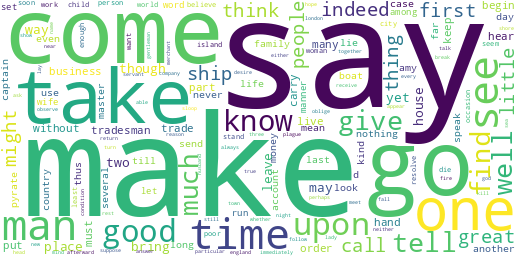

# Most common words of dickens

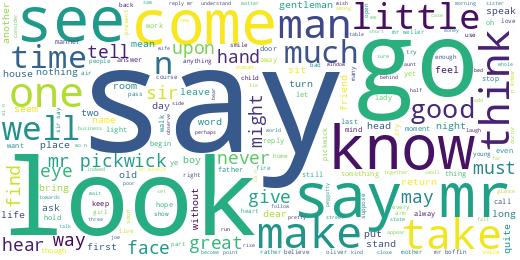

# Most common words of doyle

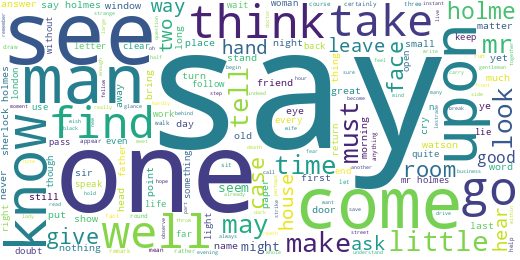

# Most common words of twain

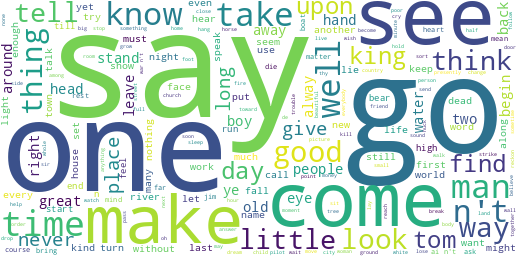

In [60]:
from IPython.display import Markdown, HTML

for _, row in df_concat_texts_author.iterrows():
    display(Markdown(f'''# Most common words of {row.name}'''))
    print()
    display(row['wordcloud'])
    all_txt_author = row['text_lemmatized_processed']
    fig = plot_most_common_words_freq(most_common_words(all_txt_author))
    fig.update_layout(title=f'Top 50 most frequent words of author {row.name}')
    display(fig)

**Looks like there are a lot of words that are the most common for all authors.**

Therefore, we can redo the analysis after removing the most common words globally

In [61]:
df_concat_texts_author['text_lemmatized_processed_wo_most_common_global'] = df_concat_texts_author['text_lemmatized_processed'].apply(
    lambda txt: ' '.join([w for w in word_tokenize(txt) if w not in most_common_global_words])
)
df_concat_texts_author['wordcloud_wo_most_common_global'] = df_concat_texts_author['text_lemmatized_processed_wo_most_common_global'].apply(lambda txt: wc.generate(txt).to_image())

In [ ]:
d_author_to_wordcloud = {}

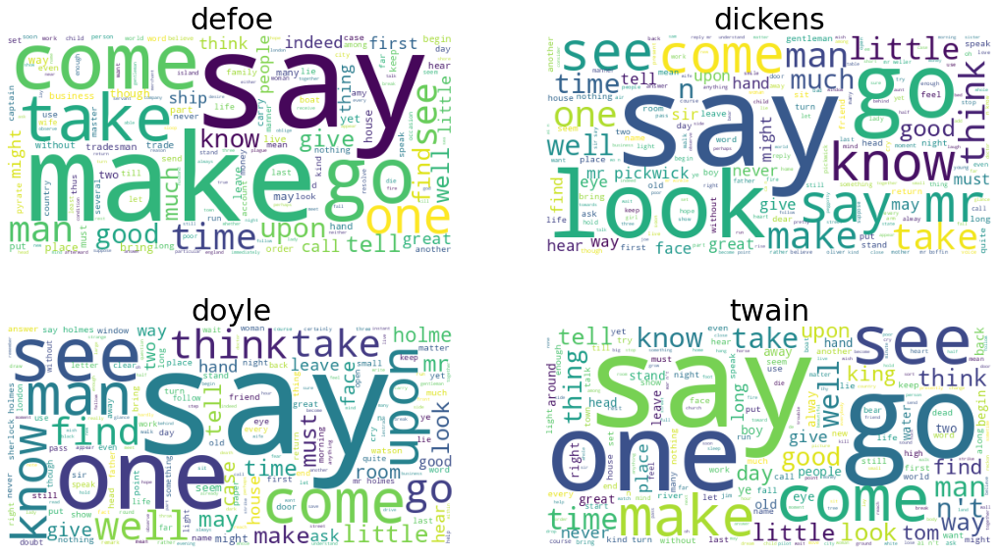

In [86]:
import matplotlib.pyplot as plt
from math import ceil

num_authors = len(df_concat_texts_author)
num_cols_plot_wordcloud = 2
num_rows_plot_wordcloud = ceil(num_authors / num_cols_plot_wordcloud)

fig, axes = plt.subplots(num_rows_plot_wordcloud, num_cols_plot_wordcloud, figsize=(18, 10))

idx = 0
for i in range(num_rows_plot_wordcloud):
    for j in range(num_cols_plot_wordcloud):
        if idx == num_authors:
            break
        ax = axes[i, j]
        ax.imshow(df_concat_texts_author.iloc[idx]['wordcloud'])
        ax.axis('off');
        ax.set_title(df_concat_texts_author.index.values[idx], fontsize=30)
        idx += 1


In [87]:
def get_bigrams_data(txt, tag, col):
    cleaned_text = clean_text(txt)
    all_bigrams = ngrams(cleaned_text, 2)
    topbigrams = Counter(all_bigrams).most_common(25)
    xvals = list(reversed([_[0] for _ in topbigrams]))
    yvals = list(reversed([_[1] for _ in topbigrams]))
    trace = go.Bar(x=yvals, y=xvals, name=tag, marker=dict(color=col), xaxis=dict(linecolor='#fff',), opacity=0.7, orientation='h')
    return trace

In [88]:
# trace1 = get_bigrams_data(fire_text, 'fire', '#4286f4')
# trace2 = get_bigrams_data(hurricane_text, 'hurricane', '#f44268')
# trace3 = get_bigrams_data(flood_text, 'flood', '#e0d75e')
# trace4 = get_bigrams_data(storm_text, 'storm', '#3e8441')

# fig = tools.make_subplots(rows=1, cols=4, print_grid=False);
# fig.append_trace(trace1, 1, 1);
# fig.append_trace(trace2, 1, 2);
# fig.append_trace(trace3, 1, 3);
# fig.append_trace(trace4, 1, 4);

# fig['layout'].update(height=800, title='Top Bigrams used in disaster related Headlines', legend=dict(orientation="v"));
# iplot(fig, filename='simple-subplot');

In [90]:
for _,row in df_concat_texts_author.iterrows():
#     display(Markdown(f'''# Most common words of {row.name} (without common top global words)'''))
#     print()
#     display(row['wordcloud_wo_most_common_global'])
    all_txt_author = row['text_lemmatized_processed_wo_most_common_global']
    most_common_author_words_w_freq = Counter(word_tokenize(all_txt_author)).most_common(NUM_TOP_WORDS)
    fig = plot_most_common_words_freq(most_common_author_words_w_freq)
    fig.update_layout(title=f'Top 50 most frequent words of "{row.name}" without common global words')
    display(fig)

Now we can really see some interesting common words for each author. For example:
- "_Holmes_", "_Watson_", "_room_" for Doyle (From Sherlock holmes) and more related words of crime scene investigation (face, window, look, case, ...)
- "_Tom_" for Twain (Tom Sawyer)
- "_Ship_", "_tradesman_" for Defoe (Robinson Crusoe)

After the lexical analysis, let's also analyze semantic aspects of the texts, like polarity.

In [60]:
# !pip install TextBlob==0.17.1

True

In [68]:
import textstat
from textblob import TextBlob
nltk.download('averaged_perceptron_tagger', quiet=True)
nltk.download('brown', quiet=True)


def set_text_sentiment_textblob(df, colname_text='text'):
    '''
    Sentiment analysis should always be computed in unprocessed text
    '''
    df['sentiment'] = df[colname_text].progress_apply(lambda txt: TextBlob(txt).sentiment)
    df['polarity'] = df['sentiment'].apply(lambda sentiment: sentiment.polarity)
    df['subjectivity'] = df['sentiment'].apply(lambda sentiment: sentiment.polarity)
    return df.drop('sentiment', axis=1)


LIST_TUPLES_READABILITY_STATISTICS = [
        ('flesch_reading_ease', textstat.flesch_reading_ease),
        ('flesch_kincaid_grade', textstat.flesch_kincaid_grade),
        ('gunning_fog', textstat.gunning_fog),
        ('automated_readability_index', textstat.automated_readability_index),
        ('coleman_liau_index', textstat.coleman_liau_index),
        ('linsear_write_formula', textstat.linsear_write_formula),
        ('dale_chall_readability_score', textstat.dale_chall_readability_score),
        ('mcalpine_eflaw', textstat.mcalpine_eflaw),
        ('reading_time', textstat.reading_time),
        ('syllable_count', textstat.syllable_count),
        ('lexicon_count', textstat.lexicon_count),
        ('char_count', textstat.char_count),
        ('letter_count', textstat.letter_count),
        ('polysyllabcount', textstat.polysyllabcount),
        ('monosyllabcount', textstat.monosyllabcount)
    ]

def set_text_readability_statistics(df, colname_text='text'):
    '''
    Readability statistics should always be computed on unprocessed text
    '''
    for new_colname, fn in tqdm(LIST_TUPLES_READABILITY_STATISTICS):
        df[new_colname] = df[colname_text].apply(fn)
    return df

In [90]:
# !pip install textstat==0.7.3

In [ ]:
df_tr_ev = set_text_readability_statistics(df_tr_ev, colname_text='text')

In [70]:
df_tr_ev = set_text_sentiment_textblob(df_tr_ev, colname_text='text')

100%|███████████████████████████████████| 40000/40000 [00:16<00:00, 2498.04it/s]


In [71]:
df_measures_per_author = df_tr_ev.groupby('author').agg(
    {
        **{'polarity': list, 'subjectivity': list},
        **{k:list for k in list(zip(*LIST_TUPLES_READABILITY_STATISTICS))[0]}
    }
)

In [72]:
df_measures_per_author.applymap(np.mean)

,polarity,subjectivity,flesch_reading_ease,flesch_kincaid_grade,gunning_fog,automated_readability_index,coleman_liau_index,linsear_write_formula,dale_chall_readability_score,mcalpine_eflaw,reading_time,syllable_count,lexicon_count,char_count,letter_count,polysyllabcount,monosyllabcount
author,,,,,,,,,,,,,,,,,
defoe,0.093046,0.093046,41.324794,21.28920,24.107359,26.76735,7.620036,28.776799,9.394691,81.53586,4.732209,96.0404,74.5767,322.1394,310.4077,4.4677,58.7449
dickens,0.091512,0.091512,73.411055,8.22065,10.565672,10.57678,7.142361,11.487999,8.655849,30.49424,3.427025,67.8090,51.3347,233.2898,219.6400,3.5074,39.4159
doyle,0.063080,0.063080,78.882545,6.77440,9.186636,8.33762,6.441077,9.748760,7.657182,26.60480,3.046188,61.2100,47.4832,207.3649,198.0895,2.8908,37.4035
twain,0.091341,0.091341,71.755769,9.50303,11.880296,12.14201,7.228143,13.534590,8.214265,36.60834,3.657252,72.4259,56.1171,248.9630,238.0940,3.2701,44.0409


In [73]:
from plotly.subplots import make_subplots
from math import ceil

num_row_plots = ceil(len(df_measures_per_author.columns)/2)
num_col_plots = 3
fig = make_subplots(
    rows=num_row_plots,
    cols=num_col_plots,
    subplot_titles=([statname for statname in df_measures_per_author.columns]),
    vertical_spacing=0.05
)


idx = 0
for i in range(1, num_row_plots+1):
    for j in range(1, num_col_plots+1):
        if idx == len(df_measures_per_author.columns):
            break
        statname = df_measures_per_author.columns[idx]
        subfig = px.box(
            df_measures_per_author.reset_index().explode(statname),
            y=statname,
            x='author',
#             height=800,
            points=False # Don't show outliers so we see the boxes better (unsquashed)
        )
#         subfig.show()
        assert len(subfig.data) == 1
        fig.add_trace(
            subfig.data[0],
            row=i, col=j
        )


        idx += 1
fig.update_layout(height=3500, width=1200, title_text="Statistics per author")
fig.show()

## Sentiment and reading-difficutly analysis conclusions
- All 4 authors have the same `polarity` and `subjectivity` in average
- Most readability metrics support that __Defoe__ is the hardest author to understand when reading (they show high necessary grade overall to understand his texts).
    - For example, his median `flesch_readability_score` is clearly the lowest with a value of `47.8` vs `86.4` (dickens), `80.92` (doyle) and `86.33` (twain)
    - In overall, looks like reading difficulty is `Defoe > Dickens = Twain > Doyle`
- Most writing-style-related analysis like `reading-time`, `lexicon-count`, `syllable-count`, `monosyllable-count`, `pollysylable-count`, etc. show a slight tendence of __Doyle__ over the other authors to write shorter, faster to read text pieces.

In [75]:
from sklearn.model_selection import train_test_split
df_tr, df_ev = train_test_split(df_tr_ev, test_size=0.25, stratify=df_tr_ev['author'], random_state=288)

In [77]:
def get_text_stats_features(df):
    return df[['polarity',
       'subjectivity', 'flesch_reading_ease', 'flesch_kincaid_grade',
       'gunning_fog', 'automated_readability_index', 'coleman_liau_index',
       'linsear_write_formula', 'dale_chall_readability_score',
       'mcalpine_eflaw', 'reading_time', 'syllable_count', 'lexicon_count',
       'char_count', 'letter_count', 'polysyllabcount', 'monosyllabcount']].to_numpy()

X_tr_stats = get_text_stats_features(df_tr)
X_ev_stats = get_text_stats_features(df_ev)

In [78]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf_char = TfidfVectorizer(
    ngram_range=(1,5),
    analyzer='char_wb',
    min_df=20,
    max_df=0.7
)



X_tfidf_char_tr = tfidf_char.fit_transform(df_tr['text_processed'])
display(len(tfidf_char.vocabulary_))
X_tfidf_char_ev = tfidf_char.transform(df_ev['text_processed'])

31630

In [79]:
from sklearn.decomposition import TruncatedSVD

tsvd_char = TruncatedSVD(n_components=1300, random_state=288)
X_tfidf_char_tsvd_tr = tsvd_char.fit_transform(X_tfidf_char_tr)
print(f'Cumulative sum of explained variance ratio kept by tsvd_char: {round(tsvd_char.explained_variance_ratio_.cumsum()[-1], 4)}')
X_tfidf_char_tsvd_ev = tsvd_char.transform(X_tfidf_char_ev)

Cumulative sum of explained variance ratio kept by tsvd_char: 0.6871


In [ ]:
# Lemmatize first
tfidf_word = TfidfVectorizer(
    ngram_range=(1,3),
    analyzer='word',
    min_df=10,
    max_df=0.8
)

X_tfidf_word_tr = tfidf_word.fit_transform(df_tr['text_lemmatized_processed'])
display(len(tfidf_word.vocabulary_))
X_tfidf_word_ev = tfidf_word.transform(df_ev['text_lemmatized_processed'])


tsvd_word = TruncatedSVD(n_components=400, random_state=288)
X_tfidf_word_tsvd_tr = tsvd_word.fit_transform(X_tfidf_word_tr)
print(f'Cumulative sum of explained variance ratio kept by tsvd_word: {round(tsvd_word.explained_variance_ratio_.cumsum()[-1], 4)}')
X_tfidf_word_tsvd_ev = tsvd_word.transform(X_tfidf_word_ev)

Cumulative sum of explained variance ratio kept by tsvd: 0.6661


array([[ 0.23750624,  0.08917448, -0.03069585,  0.02634209,  0.00124416],
       [ 0.21352595, -0.01744305,  0.02105723, -0.04114096, -0.03803108],
       [ 0.21975934,  0.03465721, -0.0074753 ,  0.08643861, -0.06977318],
       ...,
       [ 0.31528994, -0.12786   ,  0.02204847,  0.0325408 ,  0.01657635],
       [ 0.26246008, -0.02371493,  0.04224156, -0.05067165, -0.02599246],
       [ 0.22122294, -0.07078682,  0.02155858,  0.01526904,  0.02049461]])

In [207]:
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()

In [210]:
X_tr = np.hstack([X_tr_stats, X_tfidf_tsvd_tr])
X_ev = np.hstack([X_ev_stats, X_tfidf_tsvd_ev])

In [211]:
X_tr_scaled = scaler.fit_transform(X_tr)
X_ev_scaled = scaler.transform(X_ev)

In [218]:
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier
from sklearn.neural_network import MLPClassifier

# clf = RandomForestClassifier(verbose=3, n_jobs=8)
clf = MLPClassifier(
    hidden_layer_sizes=(512,512,512),
    batch_size=64,
    max_iter=10000,
    random_state=288,
    verbose=True,
    early_stopping=True,
    n_iter_no_change=100
)

In [35]:
!pip install cleantext

You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [219]:
clf.fit(X_tr, df_tr['author'])

Iteration 1, loss = 1.41541930
Validation score: 0.538667
Iteration 2, loss = 1.02481296
Validation score: 0.589000
Iteration 3, loss = 0.83216833
Validation score: 0.570667
Iteration 4, loss = 0.63882108
Validation score: 0.820333
Iteration 5, loss = 0.48306114
Validation score: 0.845333
Iteration 6, loss = 0.44027475
Validation score: 0.745333
Iteration 7, loss = 0.39492383
Validation score: 0.687333
Iteration 8, loss = 0.40883524
Validation score: 0.821333
Iteration 9, loss = 0.36772016
Validation score: 0.824667
Iteration 10, loss = 0.36619369
Validation score: 0.867000
Iteration 11, loss = 0.35131269
Validation score: 0.861333
Iteration 12, loss = 0.33326852
Validation score: 0.862000
Iteration 13, loss = 0.35288541
Validation score: 0.854000
Iteration 14, loss = 0.35099803
Validation score: 0.864333
Iteration 15, loss = 0.35492914
Validation score: 0.813000
Iteration 16, loss = 0.33593616
Validation score: 0.791333
Iteration 17, loss = 0.32980458
Validation score: 0.855667
Iterat

Validation score: 0.837667
Iteration 140, loss = 0.13961003
Validation score: 0.855333
Iteration 141, loss = 0.13704275
Validation score: 0.850667
Iteration 142, loss = 0.14958162
Validation score: 0.871667
Iteration 143, loss = 0.12905049
Validation score: 0.861000
Iteration 144, loss = 0.14363866
Validation score: 0.816667
Iteration 145, loss = 0.13556232
Validation score: 0.857667


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:619: UserWarning:

Training interrupted by user.



MLPClassifier(batch_size=64, early_stopping=True,
              hidden_layer_sizes=(512, 512, 512), max_iter=10000,
              n_iter_no_change=100, random_state=288, verbose=True)

In [220]:
from sklearn.metrics import classification_report

Y_hat_tr = clf.predict(X_tr)
Y_hat_ev = clf.predict(X_ev)

In [221]:
print(classification_report(df_tr['author'], Y_hat_tr))

              precision    recall  f1-score   support

       defoe       0.98      0.97      0.97      7500
     dickens       0.92      0.94      0.93      7500
       doyle       0.95      0.93      0.94      7500
       twain       0.92      0.94      0.93      7500

    accuracy                           0.94     30000
   macro avg       0.94      0.94      0.94     30000
weighted avg       0.94      0.94      0.94     30000



In [216]:
print(classification_report(df_tr['author'], Y_hat_tr))

              precision    recall  f1-score   support

       defoe       0.97      0.92      0.95      7500
     dickens       0.88      0.91      0.89      7500
       doyle       0.90      0.93      0.91      7500
       twain       0.90      0.89      0.89      7500

    accuracy                           0.91     30000
   macro avg       0.91      0.91      0.91     30000
weighted avg       0.91      0.91      0.91     30000



In [222]:
print(classification_report(df_ev['author'], Y_hat_ev))

              precision    recall  f1-score   support

       defoe       0.94      0.93      0.93      2500
     dickens       0.84      0.86      0.85      2500
       doyle       0.88      0.86      0.87      2500
       twain       0.85      0.86      0.85      2500

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



In [217]:
print(classification_report(df_ev['author'], Y_hat_ev))

              precision    recall  f1-score   support

       defoe       0.96      0.89      0.92      2500
     dickens       0.82      0.86      0.84      2500
       doyle       0.84      0.88      0.86      2500
       twain       0.85      0.84      0.84      2500

    accuracy                           0.87     10000
   macro avg       0.87      0.87      0.87     10000
weighted avg       0.87      0.87      0.87     10000

